In [8]:
import site
site.addsitedir("C:\\Users\\mickey\\aoLab\\Code\\hierarchical_lfads")
from utils import read_data
import torch
import matplotlib.pyplot as plt

In [3]:
data_path = "C:\\Users\\mickey\\aoLab\\code\\hierarchical_lfads\\lorenz_100"
data_dict = read_data(data_path)

In [5]:
# list of all data types in the dataset.
data_dict.keys()

dict_keys(['cell_loc', 'cells', 'dt', 'train_calcium', 'train_fluor', 'train_latent', 'train_rates', 'train_spikes', 'valid_calcium', 'valid_fluor', 'valid_latent', 'valid_rates', 'valid_spikes'])

In [14]:
# (x, y) location of each cell in the network.
data_dict['cell_loc'].shape

(2, 50)

In [7]:
# cell locations in an interacting network. Not sure where this comes from.
data_dict['cells'].shape
plt.imshow(data_dict['cells'].mean(axis=0))

(50, 128, 128)

In [15]:
# dt is the time step. what a stretch!
data_dict['dt']

array(0.01)

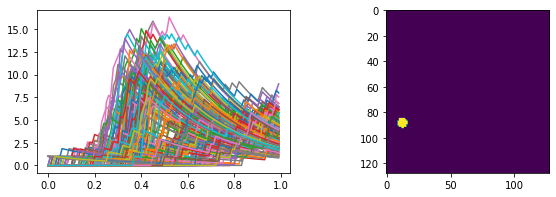

In [25]:
# note the train/valid symmetry in this data
# these are the traces of observed gcamp signals from each cell. This is the reconstruction.
data_dict['train_calcium'].shape # [trials, time, channels]
cell_idx = 0
f,ax = plt.subplots(1,2,figsize=(10,3))
ax[0].plot(torch.arange(100)*data_dict['dt'],data_dict['valid_calcium'][:,:,cell_idx].T);
ax[1].imshow(data_dict['cells'][cell_idx,])

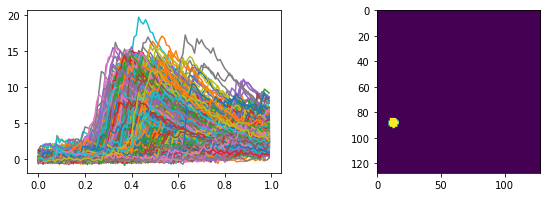

In [28]:
# this appears to be the calcium signal with added noise. Not sure how this is passed to the model - maybe it's just a harder thing to learn, or a way of showing noise robustness?
# OH! This is interesting. The only difference is the noise level, and the output chosen is selected by the 'data_prefix' variable when deciding how to train the model. I can create a single 'goose_250' dataset with many different filter levels in it.
data_dict['train_fluor'].shape
f,ax = plt.subplots(1,2,figsize=(10,3))
ax[0].plot(torch.arange(100)*data_dict['dt'],data_dict['train_fluor'][:,:,cell_idx].T);
ax[1].imshow(data_dict['cells'][cell_idx,])

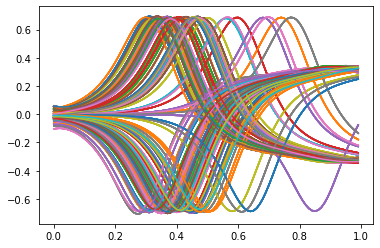

In [34]:
# latent
# This is definitely one of the embedded signal representations that the model is trying to learn, but I don't know how they're incorporated into the training task itself. I should check the Plotter class to see if this data is only used there.abs

data_dict['train_latent'].shape
plt.plot(torch.arange(100)*data_dict['dt'],data_dict['train_latent'][:,:,cell_idx].T);

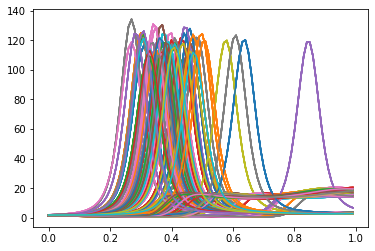

In [36]:
# rates
# ditto with the above
data_dict['train_rates'].shape
plt.plot(torch.arange(100)*data_dict['dt'],data_dict['train_rates'][:,:,cell_idx].T);

(800, 100, 50)


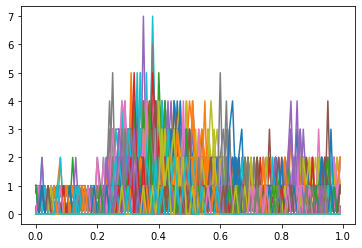

In [39]:
# spikes
# I'm worried about this one. I don't know how our model is going to have this incorporated into it. I'm guessing this is the controller input?
print(data_dict['train_rates'].shape)
plt.plot(torch.arange(100)*data_dict['dt'],data_dict['train_spikes'][:,:,cell_idx].T);